In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

DATASET_PATH = "/content/drive/MyDrive/Dataset_BUSI_with_GT"
OUTPUT_PATH = "/content/dataset_yolo"

In [ ]:
import shutil

normal_path = os.path.join(DATASET_PATH, "normal")

if os.path.exists(normal_path):
    shutil.rmtree(normal_path)
    print("✅ normal deleted")

In [ ]:
import os

dataset_path = "/content/drive/MyDrive/Dataset_BUSI_with_GT"

benign = len([
    f for f in os.listdir(os.path.join(dataset_path,"benign"))
    if f.endswith(".png") and "_mask" not in f
])

malignant = len([
    f for f in os.listdir(os.path.join(dataset_path,"malignant"))
    if f.endswith(".png") and "_mask" not in f
])

print("Benign =", benign)
print("Malignant =", malignant)
print("Total =", benign + malignant)

Benign = 437
Malignant = 210
Total = 647


In [ ]:
import os
import random
import shutil
from sklearn.model_selection import KFold

DATASET_PATH = "/content/drive/MyDrive/Dataset_BUSI_with_GT"
OUTPUT_BASE = "/content/BUSI_5Fold"

random.seed(42)

all_images = []

for cls in ["benign", "malignant"]:

    folder = os.path.join(DATASET_PATH, cls)

    for file in os.listdir(folder):

        if file.endswith(".png") and "_mask" not in file:

            all_images.append({
                "class": cls,
                "image": file
            })

print("Total Images =", len(all_images))

kf = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

for fold, (train_idx, val_idx) in enumerate(kf.split(all_images), start=1):

    fold_dir = os.path.join(OUTPUT_BASE, f"fold_{fold}")

    for split in ["train", "val"]:
        os.makedirs(os.path.join(fold_dir, split, "images"), exist_ok=True)
        os.makedirs(os.path.join(fold_dir, split, "labels"), exist_ok=True)

    for split_name, indices in {
        "train": train_idx,
        "val": val_idx
    }.items():

        for idx in indices:

            item = all_images[idx]

            cls = item["class"]
            file = item["image"]

            src_img = os.path.join(DATASET_PATH, cls, file)

            src_mask = src_img.replace(".png", "_mask.png")

            shutil.copy(src_img,
                        os.path.join(
                            fold_dir,
                            split_name,
                            "images",
                            file
                        ))

            shutil.copy(src_mask,
                        os.path.join(
                            fold_dir,
                            split_name,
                            "labels",
                            file.replace(".png", "_mask.png")
                        ))

    print(f"Fold {fold} created")

Total Images = 647
Fold 1 created
Fold 2 created
Fold 3 created
Fold 4 created
Fold 5 created


In [ ]:
!find /content/BUSI_5Fold -type d

/content/BUSI_5Fold
/content/BUSI_5Fold/fold_2
/content/BUSI_5Fold/fold_2/val
/content/BUSI_5Fold/fold_2/val/labels
/content/BUSI_5Fold/fold_2/val/images
/content/BUSI_5Fold/fold_2/train
/content/BUSI_5Fold/fold_2/train/labels
/content/BUSI_5Fold/fold_2/train/images
/content/BUSI_5Fold/fold_3
/content/BUSI_5Fold/fold_3/val
/content/BUSI_5Fold/fold_3/val/labels
/content/BUSI_5Fold/fold_3/val/images
/content/BUSI_5Fold/fold_3/train
/content/BUSI_5Fold/fold_3/train/labels
/content/BUSI_5Fold/fold_3/train/images
/content/BUSI_5Fold/fold_1
/content/BUSI_5Fold/fold_1/val
/content/BUSI_5Fold/fold_1/val/labels
/content/BUSI_5Fold/fold_1/val/images
/content/BUSI_5Fold/fold_1/train
/content/BUSI_5Fold/fold_1/train/labels
/content/BUSI_5Fold/fold_1/train/images
/content/BUSI_5Fold/fold_4
/content/BUSI_5Fold/fold_4/val
/content/BUSI_5Fold/fold_4/val/labels
/content/BUSI_5Fold/fold_4/val/images
/content/BUSI_5Fold/fold_4/train
/content/BUSI_5Fold/fold_4/train/labels
/content/BUSI_5Fold/fold_4/train

In [ ]:
!find /content/BUSI_5Fold/fold_1/train/labels | head

/content/BUSI_5Fold/fold_1/train/labels
/content/BUSI_5Fold/fold_1/train/labels/malignant (105)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/malignant (57)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (114)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/malignant (137)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (193)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/malignant (152)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (240)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (63)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (379)_mask.png


In [ ]:
!find /content/BUSI_5Fold/fold_1/train/labels | head

/content/BUSI_5Fold/fold_1/train/labels
/content/BUSI_5Fold/fold_1/train/labels/malignant (105)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/malignant (57)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (114)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/malignant (137)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (193)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/malignant (152)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (240)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (63)_mask.png
/content/BUSI_5Fold/fold_1/train/labels/benign (379)_mask.png


In [ ]:
import os
import cv2
import numpy as np

base = "/content/BUSI_5Fold"

for fold in range(1, 6):

    for split in ["train", "val"]:

        labels_dir = f"{base}/fold_{fold}/{split}/labels"

        for file in os.listdir(labels_dir):

            if not file.endswith("_mask.png"):
                continue

            mask_path = os.path.join(labels_dir, file)

            mask = cv2.imread(mask_path, 0)

            if mask is None:
                continue

            contours, _ = cv2.findContours(
                mask,
                cv2.RETR_EXTERNAL,
                cv2.CHAIN_APPROX_SIMPLE
            )

            if len(contours) == 0:
                os.remove(mask_path)
                continue

            cnt = max(contours, key=cv2.contourArea)

            x, y, w, h = cv2.boundingRect(cnt)

            H, W = mask.shape

            x_center = (x + w/2) / W
            y_center = (y + h/2) / H
            w_norm = w / W
            h_norm = h / H

            cls = 1 if "malignant" in file.lower() else 0

            txt_path = mask_path.replace("_mask.png", ".txt")

            with open(txt_path, "w") as f:
                f.write(
                    f"{cls} {x_center} {y_center} {w_norm} {h_norm}"
                )

            os.remove(mask_path)

print("YOLO Detection labels created successfully")

YOLO Detection labels created successfully


In [ ]:
!find /content/BUSI_5Fold/fold_1/train/labels | head

/content/BUSI_5Fold/fold_1/train/labels
/content/BUSI_5Fold/fold_1/train/labels/benign (11).txt
/content/BUSI_5Fold/fold_1/train/labels/benign (247).txt
/content/BUSI_5Fold/fold_1/train/labels/benign (228).txt
/content/BUSI_5Fold/fold_1/train/labels/benign (337).txt
/content/BUSI_5Fold/fold_1/train/labels/benign (257).txt
/content/BUSI_5Fold/fold_1/train/labels/benign (375).txt
/content/BUSI_5Fold/fold_1/train/labels/malignant (100).txt
/content/BUSI_5Fold/fold_1/train/labels/malignant (201).txt
/content/BUSI_5Fold/fold_1/train/labels/malignant (94).txt


In [ ]:
import os

for fold in range(1,6):

    yaml_text = f"""
path: /content/BUSI_5Fold/fold_{fold}

train: train/images
val: val/images

nc: 2

names:
  0: benign
  1: malignant
"""

    with open(f"/content/fold_{fold}.yaml","w") as f:
        f.write(yaml_text)

print("YAML files created")

YAML files created


In [ ]:
for fold in range(1,6):

    train_imgs = len(os.listdir(f"/content/BUSI_5Fold/fold_{fold}/train/images"))
    train_lbls = len(os.listdir(f"/content/BUSI_5Fold/fold_{fold}/train/labels"))

    val_imgs = len(os.listdir(f"/content/BUSI_5Fold/fold_{fold}/val/images"))
    val_lbls = len(os.listdir(f"/content/BUSI_5Fold/fold_{fold}/val/labels"))

    print(
        f"Fold {fold}: "
        f"Train {train_imgs}/{train_lbls} | "
        f"Val {val_imgs}/{val_lbls}"
    )

Fold 1: Train 517/517 | Val 130/130
Fold 2: Train 517/517 | Val 130/130
Fold 3: Train 518/518 | Val 129/129
Fold 4: Train 518/518 | Val 129/129
Fold 5: Train 518/518 | Val 129/129


In [ ]:
!pip install ultralytics
from ultralytics import YOLO

for fold in range(1,6):

    print("="*50)
    print(f"FOLD {fold}")
    print("="*50)

    model = YOLO("yolov8n.pt")

    model.train(
        data=f"/content/fold_{fold}.yaml",
        epochs=20,
        imgsz=640,
        batch=16,
        project="BUSI_5Fold",
        name=f"fold_{fold}"
    )

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 30.8 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
FOLD 1
Ultralytics 8.4.75 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fold_1.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epoc

In [ ]:
results = model.predict(
    source="/content/BUSI_5Fold/fold_5/val/images",
    save=True,
    conf=0.25
)

for r in results:
    for box in r.boxes:
        cls = int(box.cls[0])
        conf = float(box.conf[0])

        print(
            f"Class: {model.names[cls]} | Confidence: {conf:.4f}"
        )


image 1/129 /content/BUSI_5Fold/fold_5/val/images/benign (101).png: 544x640 1 benign, 169.9ms
image 2/129 /content/BUSI_5Fold/fold_5/val/images/benign (103).png: 512x640 1 benign, 150.1ms
image 3/129 /content/BUSI_5Fold/fold_5/val/images/benign (106).png: 576x640 1 benign, 138.5ms
image 4/129 /content/BUSI_5Fold/fold_5/val/images/benign (108).png: 512x640 (no detections), 17.7ms
image 5/129 /content/BUSI_5Fold/fold_5/val/images/benign (109).png: 544x640 2 benigns, 28.5ms
image 6/129 /content/BUSI_5Fold/fold_5/val/images/benign (11).png: 576x640 1 benign, 28.5ms
image 7/129 /content/BUSI_5Fold/fold_5/val/images/benign (114).png: 512x640 (no detections), 12.0ms
image 8/129 /content/BUSI_5Fold/fold_5/val/images/benign (12).png: 544x640 1 benign, 9.2ms
image 9/129 /content/BUSI_5Fold/fold_5/val/images/benign (125).png: 512x640 1 benign, 10.1ms
image 10/129 /content/BUSI_5Fold/fold_5/val/images/benign (129).png: 512x640 1 benign, 9.8ms
image 11/129 /content/BUSI_5Fold/fold_5/val/images/ben

In [ ]:
for r in results:
    for box in r.boxes:
        cls = int(box.cls[0])
        prob = float(box.conf[0]) * 100

        print(
            f"{model.names[cls]} : {prob:.2f}%"
        )

benign : 92.58%
benign : 93.34%
benign : 76.21%
benign : 82.65%
benign : 81.95%
benign : 85.16%
benign : 84.72%
benign : 74.01%
benign : 93.66%
benign : 74.80%
benign : 81.12%
benign : 82.72%
benign : 74.16%
benign : 91.20%
benign : 76.18%
benign : 57.52%
benign : 38.64%
benign : 89.60%
benign : 85.62%
benign : 90.39%
benign : 97.77%
benign : 69.25%
benign : 68.70%
benign : 41.01%
benign : 29.81%
benign : 78.49%
benign : 38.67%
benign : 32.22%
benign : 61.51%
malignant : 56.95%
benign : 90.02%
malignant : 64.47%
benign : 61.78%
benign : 46.46%
benign : 92.53%
benign : 39.73%
benign : 87.79%
benign : 32.52%
malignant : 37.00%
benign : 85.42%
benign : 76.36%
benign : 72.02%
benign : 74.39%
benign : 97.09%
benign : 67.14%
benign : 41.82%
benign : 36.76%
malignant : 30.85%
benign : 89.22%
malignant : 43.33%
malignant : 60.02%
benign : 86.09%
malignant : 39.82%
malignant : 54.27%
benign : 90.53%
benign : 87.10%
benign : 95.31%
benign : 94.93%
benign : 35.35%
benign : 32.70%
benign : 82.29%



image 1/129 /content/BUSI_5Fold/fold_5/val/images/benign (101).png: 544x640 1 benign, 9.6ms
image 2/129 /content/BUSI_5Fold/fold_5/val/images/benign (103).png: 512x640 1 benign, 7.4ms
image 3/129 /content/BUSI_5Fold/fold_5/val/images/benign (106).png: 576x640 1 benign, 7.6ms
image 4/129 /content/BUSI_5Fold/fold_5/val/images/benign (108).png: 512x640 (no detections), 11.2ms
image 5/129 /content/BUSI_5Fold/fold_5/val/images/benign (109).png: 544x640 2 benigns, 11.2ms
image 6/129 /content/BUSI_5Fold/fold_5/val/images/benign (11).png: 576x640 1 benign, 8.9ms
image 7/129 /content/BUSI_5Fold/fold_5/val/images/benign (114).png: 512x640 (no detections), 7.0ms
image 8/129 /content/BUSI_5Fold/fold_5/val/images/benign (12).png: 544x640 1 benign, 7.5ms
image 9/129 /content/BUSI_5Fold/fold_5/val/images/benign (125).png: 512x640 1 benign, 6.9ms
image 10/129 /content/BUSI_5Fold/fold_5/val/images/benign (129).png: 512x640 1 benign, 6.3ms
image 11/129 /content/BUSI_5Fold/fold_5/val/images/benign (136)

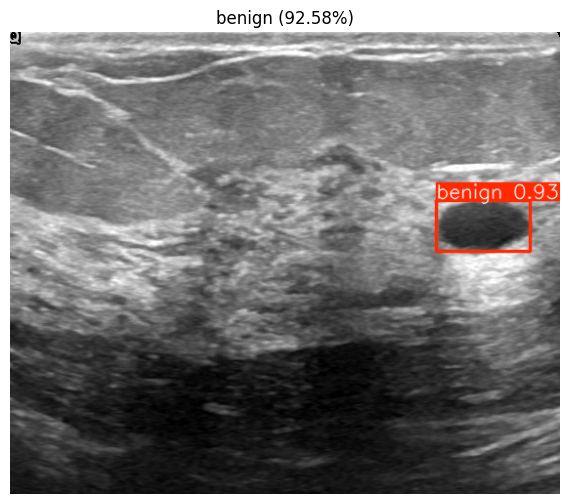

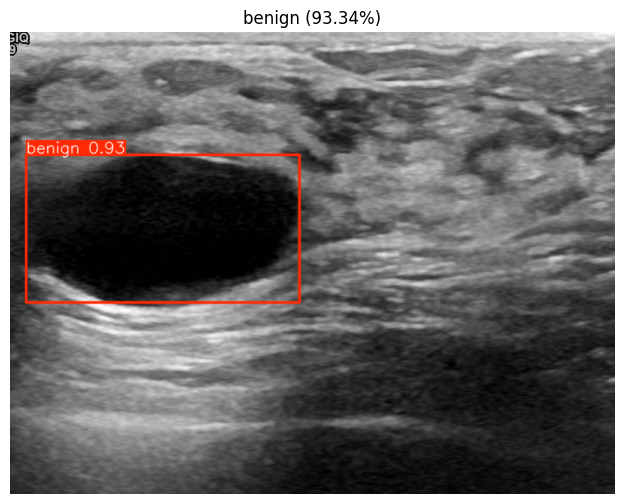

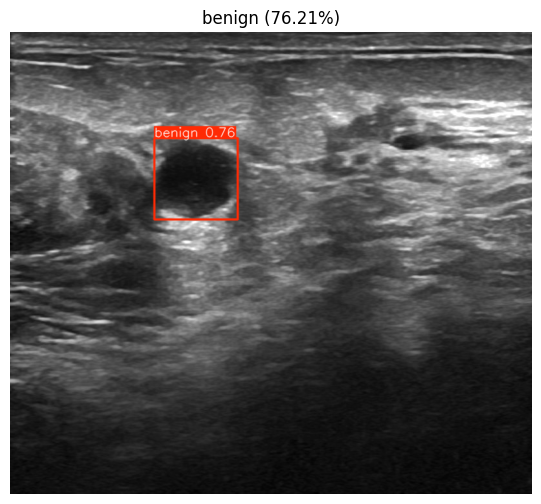

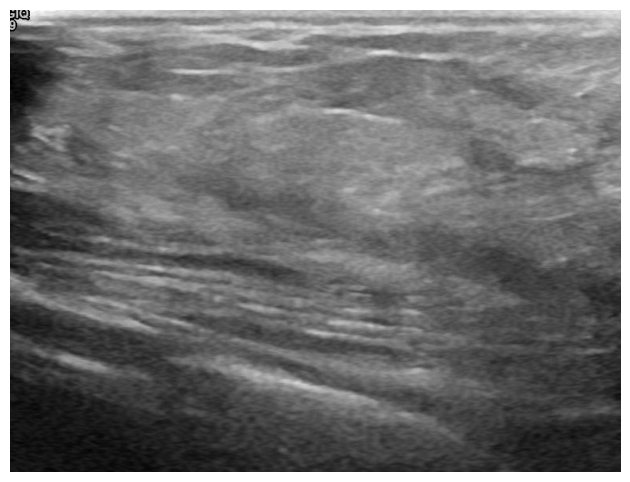

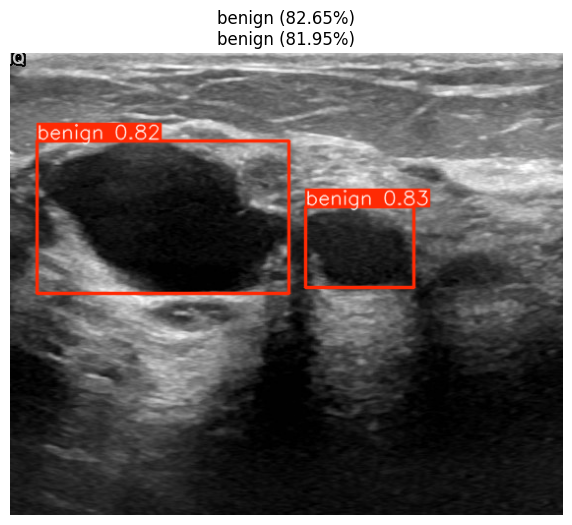

...

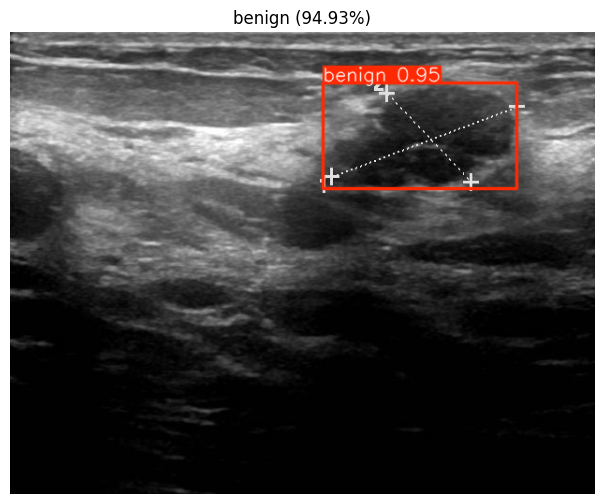

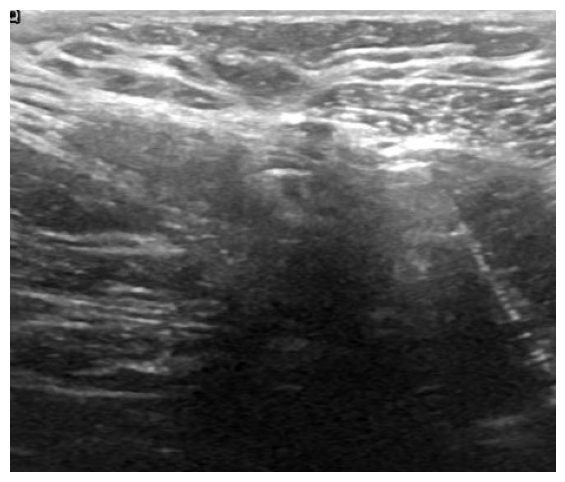

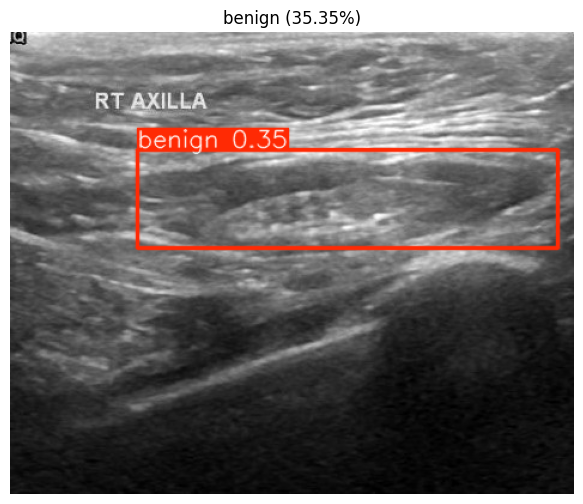

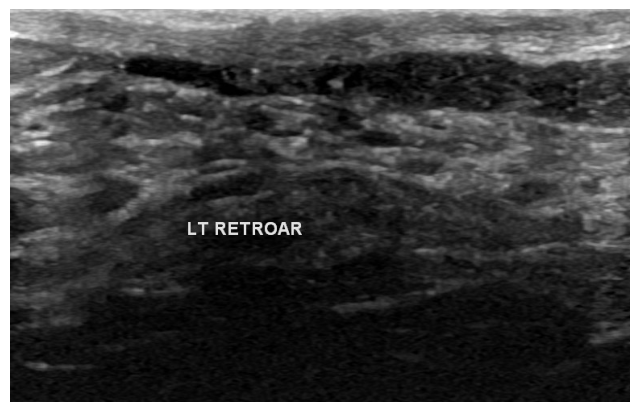

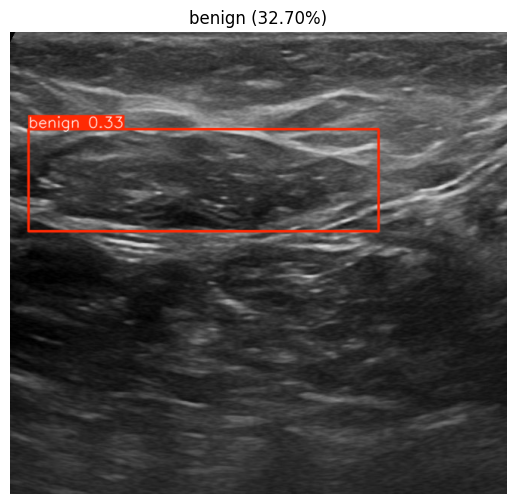

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

results = model.predict(
    source="/content/BUSI_5Fold/fold_5/val/images",
    save=False,
    conf=0.25
)

for r in results[:50]:

    img = Image.fromarray(r.plot())

    plt.figure(figsize=(8,6))
    plt.imshow(img)

    txt = []

    for box in r.boxes:
        cls = int(box.cls[0])
        conf = float(box.conf[0])

        txt.append(
            f"{model.names[cls]} ({conf*100:.2f}%)"
        )

    plt.title("\n".join(txt))
    plt.axis("off")
    plt.show()

In [ ]:
import shutil

shutil.copy(
    "/content/runs/detect/BUSI_5Fold/fold_5/weights/best.pt",
    "/content/drive/MyDrive/best.pt"
)

print("✅ Model saved to Drive")

✅ Model saved to Drive


In [ ]:
from google.colab import files

files.download("/content/drive/MyDrive/best.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>